# Bitcoin Data Analysis & Prediction.
1. Bitcoin is a decentralized digital currency, without a central bank or single administrator, that can be sent from user to user on the peer-to-peer bitcoin network without the need for intermediaries.
2. Bitcoin uses peer-to-peer technology to operate with no central authority or banks; managing transactions and the issuing of bitcoins is carried out collectively by the network.
3. Bitcoin is open-source; its design is public, nobody owns or controls Bitcoin and everyone can take part.

### Context

Things like Block chain, Bitcoin, Bitcoin cash, Ethereum, Ripple etc are constantly coming in the news articles I read. So I wanted to understand more about it and this post helped me get started. Once the basics are done, the data scientist inside me started raising questions like:

1. How many cryptocurrencies are there and what are their prices and valuations?
2. Why is there a sudden surge in the interest in recent days?

So what next?
Now that we have the price data, I wanted to dig a little more about the factors affecting the price of coins. I started of with Bitcoin and there are quite a few parameters which affect the price of Bitcoin. Thanks to Blockchain Info, I was able to get quite a few parameters on once in two day basis.

This will help understand the other factors related to Bitcoin price and also help one make future predictions in a better way than just using the historical price.

### Content
The dataset has one csv file for each currency. Price history is available on a daily basis from April 28, 2013. This dataset has the historical price information of some of the top crypto currencies by market capitalization.

1. Date : date of observation
2. Open : Opening price on the given day
3. High : Highest price on the given day
4. Low : Lowest price on the given day
5. Close : Closing price on the given day
6. Volume : Volume of transactions on the given day
7. Market Cap : Market capitalization in USD

Acknowledgements
This data is taken from coinmarketcap and it is free to use the data.

------------------------------------------------------------------------------------------------------------------

## Step 1: I am selecting bitcoin price dataset.

Dataset going to use: https://www.kaggle.com/sudalairajkumar/cryptocurrencypricehistory?select=coin_Bitcoin.csv

In [1]:
#loading the data set
import pandas as pd

In [2]:
data = pd.read_csv(r"/home/paritosh/Desktop/Probablity Project/archive/coin_Bitcoin.csv")

In [3]:
data

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
0,1,Bitcoin,BTC,2013-04-29 23:59:59,147.488007,134.000000,134.444000,144.539993,0.000000e+00,1.603769e+09
1,2,Bitcoin,BTC,2013-04-30 23:59:59,146.929993,134.050003,144.000000,139.000000,0.000000e+00,1.542813e+09
2,3,Bitcoin,BTC,2013-05-01 23:59:59,139.889999,107.720001,139.000000,116.989998,0.000000e+00,1.298955e+09
3,4,Bitcoin,BTC,2013-05-02 23:59:59,125.599998,92.281898,116.379997,105.209999,0.000000e+00,1.168517e+09
4,5,Bitcoin,BTC,2013-05-03 23:59:59,108.127998,79.099998,106.250000,97.750000,0.000000e+00,1.085995e+09
...,...,...,...,...,...,...,...,...,...,...
2986,2987,Bitcoin,BTC,2021-07-02 23:59:59,33939.588699,32770.680780,33549.600177,33897.048590,3.872897e+10,6.354508e+11
2987,2988,Bitcoin,BTC,2021-07-03 23:59:59,34909.259899,33402.696536,33854.421362,34668.548402,2.438396e+10,6.499397e+11
2988,2989,Bitcoin,BTC,2021-07-04 23:59:59,35937.567147,34396.477458,34665.564866,35287.779766,2.492431e+10,6.615748e+11
2989,2990,Bitcoin,BTC,2021-07-05 23:59:59,35284.344430,33213.661034,35284.344430,33746.002456,2.672155e+10,6.326962e+11


## Step 2: Perform data preparation, exploration & cleaning
Load the dataset into a data frame using Pandas
Explore the number of rows & columns, ranges of values etc.
Handle missing, incorrect and invalid data
Perform any additional steps (parsing dates, creating additional columns, merging multiple dataset etc.)



In [4]:
data.columns

Index(['SNo', 'Name', 'Symbol', 'Date', 'High', 'Low', 'Open', 'Close',
       'Volume', 'Marketcap'],
      dtype='object')

In [5]:
#pip install dataprep

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


  0%|          | 0/1551 [00:00<?, ?it/s]

Generating new fontManager, this may take some time...


DataPrep Report
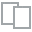
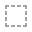
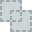
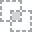
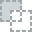
...
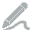
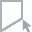
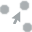
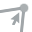
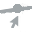

In [6]:
from dataprep.eda import create_report
create_report(data)

# see this for detailed analysis

In [7]:
data.head()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
0,1,Bitcoin,BTC,2013-04-29 23:59:59,147.488007,134.000000,134.444000,144.539993,0.0,1.603769e+09
1,2,Bitcoin,BTC,2013-04-30 23:59:59,146.929993,134.050003,144.000000,139.000000,0.0,1.542813e+09
2,3,Bitcoin,BTC,2013-05-01 23:59:59,139.889999,107.720001,139.000000,116.989998,0.0,1.298955e+09
3,4,Bitcoin,BTC,2013-05-02 23:59:59,125.599998,92.281898,116.379997,105.209999,0.0,1.168517e+09
4,5,Bitcoin,BTC,2013-05-03 23:59:59,108.127998,79.099998,106.250000,97.750000,0.0,1.085995e+09


In [8]:
data.tail()

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
2986,2987,Bitcoin,BTC,2021-07-02 23:59:59,33939.588699,32770.680780,33549.600177,33897.048590,3.872897e+10,6.354508e+11
2987,2988,Bitcoin,BTC,2021-07-03 23:59:59,34909.259899,33402.696536,33854.421362,34668.548402,2.438396e+10,6.499397e+11
2988,2989,Bitcoin,BTC,2021-07-04 23:59:59,35937.567147,34396.477458,34665.564866,35287.779766,2.492431e+10,6.615748e+11
2989,2990,Bitcoin,BTC,2021-07-05 23:59:59,35284.344430,33213.661034,35284.344430,33746.002456,2.672155e+10,6.326962e+11
2990,2991,Bitcoin,BTC,2021-07-06 23:59:59,35038.536363,33599.916169,33723.509655,34235.193451,2.650126e+10,6.418992e+11


In [9]:
data.info()
# since all the columns have same value we dont need to remove anything

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2991 entries, 0 to 2990
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SNo        2991 non-null   int64  
 1   Name       2991 non-null   object 
 2   Symbol     2991 non-null   object 
 3   Date       2991 non-null   object 
 4   High       2991 non-null   float64
 5   Low        2991 non-null   float64
 6   Open       2991 non-null   float64
 7   Close      2991 non-null   float64
 8   Volume     2991 non-null   float64
 9   Marketcap  2991 non-null   float64
dtypes: float64(6), int64(1), object(3)
memory usage: 233.8+ KB


## Step 3: Perform exploratory analysis & visualization
Compute the mean, sum, range and other interesting statistics for numeric columns
Explore distributions of numeric columns using histograms etc.
Explore relationship between columns using scatter plots, bar charts etc.
Make a note of interesting insights from the exploratory analysis



In [10]:
import matplotlib.pyplot as plt
%matplotlib inline

In [11]:
data.describe()

,SNo,High,Low,Open,Close,Volume,Marketcap
count,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2.991000e+03,2.991000e+03
mean,1496.000000,6893.326038,6486.009539,6700.146240,6711.290443,1.090633e+10,1.208761e+11
std,863.571653,11642.832456,10869.032130,11288.043736,11298.141921,1.888895e+10,2.109438e+11
min,1.000000,74.561096,65.526001,68.504997,68.431000,0.000000e+00,7.784112e+08
25%,748.500000,436.179001,422.879486,430.445496,430.569489,3.036725e+07,6.305579e+09
50%,1496.000000,2387.610107,2178.500000,2269.889893,2286.409912,9.460360e+08,3.741503e+10
75%,2243.500000,8733.926948,8289.800459,8569.656494,8576.238715,1.592015e+10,1.499957e+11
max,2991.000000,64863.098908,62208.964366,63523.754869,63503.457930,3.509679e+11,1.186364e+12


In [12]:
# getting the date when open was highest

column = data["Open"]
max_value = column.max()
print("max_value =",max_value)
print("index =", column.idxmax())

print("Date =",data["Date"][2907])

#after 4-5 days bitcoin dropped by 14% just after hiting all time high

print('                    ')
print("18 april 2021",column[2912])

max_value = 63523.75486927
index = 2907
Date = 2021-04-14 23:59:59
                    
18 april 2021 56191.5841095


Since You can see bitcoin hit all time high on 14 april 2021, even though there are no sign constant growth 

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


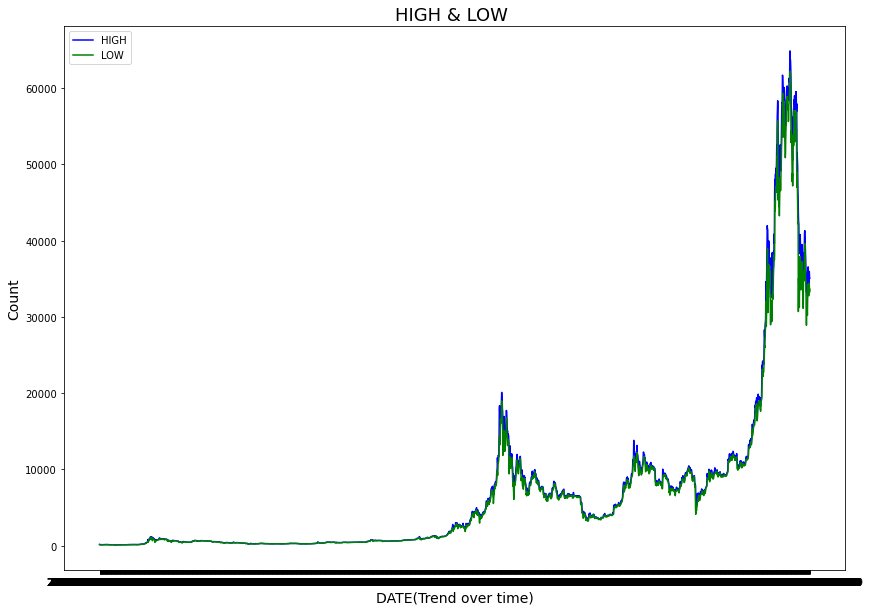

In [13]:
x=data['Date']
y1=data['High']
y2=data['Low']
plt.figure(figsize=(14,10))
plt.plot(x,y1,label='HIGH',color='blue')
plt.plot(x,y2,label='LOW',color='green')
plt.title('HIGH & LOW ',fontsize=18)
plt.xlabel('DATE(Trend over time)',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.legend()
plt.plot()
plt.savefig('saved_figure1.jpg')

# creating the high,low to check when the highest was hit and when low was hit 

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


[]

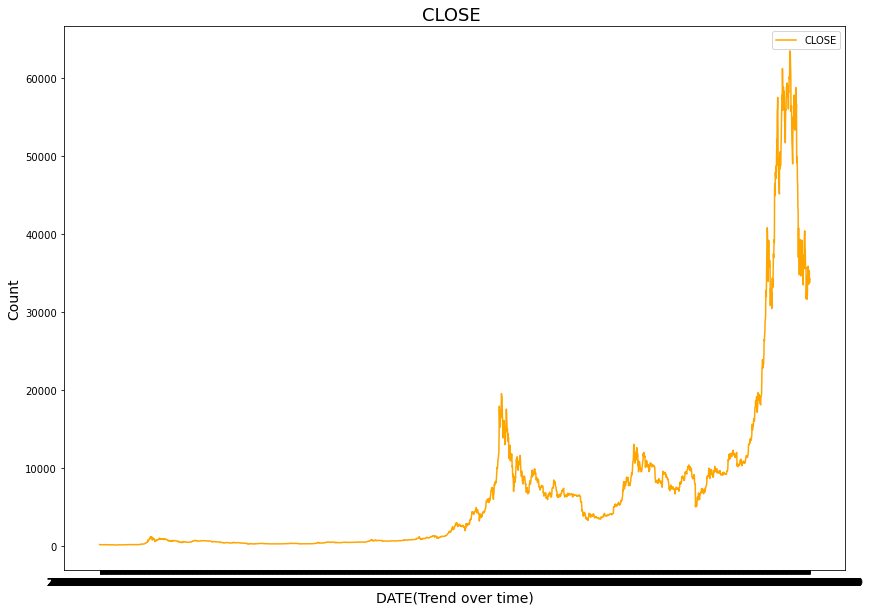

In [14]:
x=data['Date']
y2=data['Close']
plt.figure(figsize=(14,10))
plt.plot(x,y2,label='CLOSE',color='orange')
plt.title('CLOSE ',fontsize=18)
plt.xlabel('DATE(Trend over time)',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.legend()
plt.plot()

In [ ]:
x=data['Date']
y1=data['Open']
plt.figure(figsize=(14,10))
plt.plot(x,y1,label='OPEN',color='coral')
plt.title('OPEN ',fontsize=18)
plt.xlabel('DATE(Trend over time)',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.legend()
plt.plot()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


[]

In [ ]:
x=data['Date']
y1=data['Volume']
plt.figure(figsize=(14,10))
plt.plot(x,y1,label='OPEN',color='orchid')
plt.title('VOLUME ',fontsize=18)
plt.xlabel('DATE(Trend over time)',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.legend()
plt.plot()

## Step 4: Model Traning & answer questions about the data

### Questions

1. How did the historical prices / market capitalizations of various currencies change over time?
2. Predicting the future price of Bitcoin
3. Does the Open and Close effect the price? if yes How ?
4. Does the fluctuations in other currenices or stock market effect the price? or any external factors like elon musk?
5. Seasonal trend in the price fluctuations

### model creation

1. Before moving to model creation, we have to split the data into training and testing data with a specified ratio.
2. It is always considered as a good practice to take more training data in ratio as compared to the testing data so that the model can learn effectively and perform accurately.
3. For this we'll use train-test-split method from sklearn which splits the data into training and testing data on the basis of given ratio.

In [ ]:
data.columns


In [ ]:
# Import train_test_split from sklearn.model_selection
from sklearn.model_selection import train_test_split
# Here, X is the data which will have feature and y will have our target.
x=data[['High', 'Low', 'Open', 'Close','Volume']]  
y=data['Marketcap']

In [ ]:
# Split data into training data and testing data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,random_state=500) 
#Ratio used for splitting training and testing data is 8:2 respectively

In [ ]:
# Importing linear regression model
from sklearn.linear_model import LinearRegression 
reg1 = LinearRegression()

In [ ]:
# Fitting data into the model.
reg1.fit(x_train, y_train)

In [ ]:
# Making predictions 
pred1 = reg1.predict(x_test)

In [ ]:
print(pred1)

## Conclusion Drawn through analysis & prediction:

1. HIGH of BITCOIN went up after a certain duration and we can also observe a steep in it's HIGH as well as LOW.
2. High and low were constant.
3. We can also observe steep in OPEN and CLOSE of BITCOIN.
4. By using linear regression model, we got an accuracy of 99.94 % which is really a good accuracy.

### questions and answers

1. external factors affecting the growth?

   yes, as mentioned above we can see the highest growth of bitoin was seen on 14 april 2021.
   reason - Coinbase which is the largest crypto selling and buying platform got listed on nasdaq.

   refrence - https://www.cnbc.com/2021/04/14/coinbase-to-debut-on-nasdaq-in-direct-listing.html

   this lead to the growth of bitcoin since coinbase now have stable source of funding and investors can trust        them with security of their investments. 
   

2. External factors making the bitcoin drop?

   yes, as mentioned above we can see the 14% drop in prices of bitcoin only after hitting all time high,
   this is the because of blackout in china, drop in hashrates was reported

   refrence -https://www.reuters.com/technology/bitcoin-falls-111-53356-2021-04-18/

   this lead to drop of the bitcoin value. 
   
   one of the drawbacks of this cryto as currency that it can be greatly influnced by geo/govermental actions.

3. We can explain high votality of bitcoin by observing the steep in open and close of bitcoin trade.


4. After every high a low is hit, so it might help to square of your position in th market.


5. The linear regression model is predicting the volume market cap and seems to have good accuracy but we might    need to have more indicators.


THE CODE IS HOSTED AT
# https://github.com/paritoshtripathi935/Machine_learning_projects